In [1]:
!pip install rdflib
!pip install SPARQLWrapper
!pip install adjustText

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [1]:
import random
import warnings
warnings.filterwarnings('ignore')
import functools
import itertools
from typing import List, Sequence, Tuple

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rdflib
from sklearn.manifold import TSNE
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.svm import SVC

import sys
sys.path.append('pyRDF2Vec')
sys.path.append('pyRDF2Vec/pyrdf2vec')

from pyrdf2vec import RDF2VecTransformer
from pyrdf2vec.graphs import KG
from pyrdf2vec.embedders import Word2Vec
from pyrdf2vec.walkers import (
    AnonymousWalker,
    CommunityWalker,
    HALKWalker,
    NGramWalker,
    RandomWalker,
    WalkletWalker,
    WLWalker,
)
from pyrdf2vec.samplers import (
    ObjPredFreqSampler,
    PredFreqSampler,
    UniformSampler,
    ObjFreqSampler,
    PageRankSampler,
)

import pickle

In [3]:
from pyrdf2vec.graphs import KG
import pandas as pd
# Load graph
view=0
view_name='VIEW'+str(view)
results = pd.DataFrame()

# Load graph
view_path='/home/khushboo/VIEW'+str(view)+"/"

nodes = pd.read_pickle(view_path+"nodes.pkl")
edges_df = pd.read_pickle(view_path+"edges.pkl")

In [4]:
nodes['name'] = nodes['name'].apply(lambda x: x.replace('<', '').replace('>', ''))


nodes

,name,type
0,http://www.ncbi.nlm.nih.gov/gene/114112,Gene
1,http://www.ncbi.nlm.nih.gov/gene/60674,Gene
2,http://purl.obolibrary.org/obo/CL_1000405,Cell
3,http://www.ncbi.nlm.nih.gov/gene/100527949,Gene
4,http://www.ncbi.nlm.nih.gov/gene/113523636,Gene
...,...,...
83982,http://purl.obolibrary.org/obo/UBERON_0001289,Anatomy
83983,http://purl.obolibrary.org/obo/UBERON_0012337,Anatomy
83984,http://www.ncbi.nlm.nih.gov/gene/56112,Gene
83985,http://purl.obolibrary.org/obo/MONDO_0006055,Disease


In [5]:
edges_df['subject'] = edges_df['subject'].apply(lambda x: x.replace('<', '').replace('>', ''))

edges_df['predicate'] = edges_df['predicate'].apply(lambda x: x.replace('<', '').replace('>', ''))
edges_df['object'] = edges_df['object'].apply(lambda x: x.replace('<', '').replace('>', ''))

In [6]:
entities= nodes['name']
sorted(entities)[:5]

['http://purl.obolibrary.org/obo/BFO_0000001',
 'http://purl.obolibrary.org/obo/CHEBI_10545',
 'http://purl.obolibrary.org/obo/CHEBI_11596',
 'http://purl.obolibrary.org/obo/CHEBI_11851',
 'http://purl.obolibrary.org/obo/CHEBI_11955']

In [7]:
kg = KG('/home/khushboo/VIEW0/KG.nt')
kg

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7b423e808e20>>
Traceback (most recent call last):
  File "/home/khushboo/.local/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


KG(location='/home/khushboo/VIEW0/KG.nt', skip_predicates=set(), literals=[], fmt=None, mul_req=False, skip_verify=False, cache=TTLCache({}, maxsize=1024, currsize=0), _is_remote=False)

In [19]:
list(kg._entities)[:5]

[Vertex(name='http://purl.obolibrary.org/obo/UBERON_4100117'),
 Vertex(name='http://purl.obolibrary.org/obo/HP_0002500'),
 Vertex(name='http://www.ncbi.nlm.nih.gov/gene/1282'),
 Vertex(name='http://purl.obolibrary.org/obo/HP_0025040'),
 Vertex(name='http://purl.obolibrary.org/obo/CL_0000805')]

In [20]:
len(kg._entities)

83987

In [21]:
from pyrdf2vec.graphs.vertex import Vertex
entities_vertex = []
for i in entities:
    entities_vertex.append(Vertex(name=i))
entities_vertex = set(entities_vertex)
len(entities_vertex)

83987

In [22]:
[e for e in entities_vertex if e not in kg._entities]

[]

In [23]:
filtered_entities = [e for e in entities_vertex if e not in kg._entities]
not_found = list(set(filtered_entities))
print(f'{not_found} could not be found in the KG! Removing them...')
entities_vertex = set(entities_vertex) - set(filtered_entities)

[] could not be found in the KG! Removing them...


In [24]:
new_entities = []
for i in entities_vertex:
    new_entities.append(i.name)

In [25]:
entities = new_entities

In [26]:
len(entities)

83987

In [27]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix

def classify(walk_embeddings):
  for task in ['type']:

    # Split our data into train and test (50/50 split)
    data = train_test_split(nodes['name'], nodes[task],
                            stratify=nodes[task], test_size=0.5,
                            random_state=42)
    train_ent, test_ent, y_train, y_test = data

    # Create masks that filter out all entities that are INCLUDED in the KG.
    train_mask = [x in entities for x in train_ent]
    test_mask = [x in entities for x in test_ent]
    y_train = y_train[train_mask]
    y_test = y_test[test_mask]

    # Create our X_train and X_test which consists out of the created embeddings
    X_train = []
    X_test = []
    for entity in train_ent:
      if entity in entities:
        X_train.append(walk_embeddings[entities.index(entity)])
    for entity in test_ent:
      if entity in entities:
        X_test.append(walk_embeddings[entities.index(entity)])
    X_train = np.array(X_train)
    X_test = np.array(X_test)

    # Fit a Random Forest & tune some of its hyper-parameters
    rf = GridSearchCV(RandomForestClassifier(random_state=42),
                      {'n_estimators': [10, 50, 100], 'max_depth': [3, 5, None]},
                      cv=10)
    rf.fit(X_train, y_train)
    preds = rf.predict(X_test)

    # Evaluate our model on the test data
    print(task)
    print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
    print('Accuracy =', accuracy_score(y_test, preds))
    print(confusion_matrix(y_test, preds))
    print()

In [28]:
from pyrdf2vec.embedders import Word2Vec
transformer = RDF2VecTransformer(walkers=[RandomWalker(2,None)],embedder=Word2Vec(vector_size=500))
walk_embeddings = transformer.fit_transform(kg, entities)

In [29]:
walk_embeddings

([array([ 3.07846218e-02, -7.52665941e-03,  3.34510260e-04,  2.43958179e-03,
         -8.16116296e-03, -1.17061883e-02, -5.65407041e-04,  2.63393242e-02,
          1.08464854e-03,  1.84483062e-02,  8.94473772e-03,  1.52201056e-02,
         -1.69047937e-02,  5.66805759e-03,  1.89721547e-02,  1.00407726e-03,
         -1.39576588e-02, -3.37496549e-02, -7.76366936e-03,  4.60816966e-03,
         -3.38883465e-03,  1.73945781e-02, -1.70466360e-02,  2.83683976e-03,
          5.05245570e-03,  3.58800637e-03,  4.10182448e-03, -1.74618475e-02,
          3.53372749e-03, -2.85960715e-02,  1.13126552e-02, -3.64365452e-03,
          3.54335345e-02, -2.50220229e-03,  8.43695085e-03,  4.36014915e-03,
          8.69732641e-04, -3.76166664e-02, -1.87399909e-02,  1.49117620e-03,
         -2.21728720e-02, -3.39901820e-03,  2.97282152e-02,  1.66806728e-02,
         -4.69896244e-03,  3.80062731e-03, -4.53350367e-03, -7.68416049e-03,
          1.77237224e-02, -9.49937850e-04, -1.25976522e-02,  8.81435163e-03,

In [30]:
entity_embeddings = {entity: walk_embeddings[0][i] for i, entity in enumerate(entities)}

In [31]:
walk_embeddings_df  = pd.DataFrame(entity_embeddings)

In [32]:
walk_embeddings_df.columns = walk_embeddings_df.iloc[0]
walk_embeddings_df = walk_embeddings_df[1:]

In [27]:
walk_embeddings_df

,0.024638,0.016376,0.045307,0.009613,0.029863,0.110001,0.006623,0.030390,0.005924,-0.062833,...,0.006071,0.023583,0.002512,0.061377,0.063862,-0.004805,0.029869,0.005867,0.037015,0.004952
1,-0.066816,-0.003829,0.014847,0.098255,0.004349,0.048845,-0.003242,-0.011903,0.002023,-0.025295,...,-0.006095,0.002774,0.004326,0.015792,0.111805,0.076704,-0.005820,-0.002499,-0.008298,-0.001096
2,0.103528,0.009745,0.233255,0.100952,0.031311,0.346081,-0.009263,0.086977,-0.002365,0.053802,...,-0.002362,-0.005376,0.002624,0.116945,0.381314,0.033194,0.049337,0.006765,0.001601,-0.003218
3,-0.080331,0.006043,-0.043890,-0.021921,-0.003445,-0.119676,0.009259,-0.005996,0.000341,-0.048955,...,0.003341,0.015552,0.005613,-0.038278,-0.204471,0.022432,0.003631,0.003815,0.047166,0.002404
4,0.012092,0.006934,0.180384,0.057636,0.018903,-0.009768,0.002470,0.044432,0.001998,0.030105,...,0.005913,0.003918,0.006332,0.053467,0.273899,0.058362,0.061666,0.004869,0.022883,0.004244
5,-0.023857,-0.004123,-0.059041,0.008550,-0.021002,-0.104936,-0.007354,-0.004682,0.001678,0.003158,...,-0.003034,-0.009405,-0.002306,-0.059959,-0.132235,-0.000409,-0.008314,0.007056,0.003222,-0.002433
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.027801,0.012154,0.063527,-0.002380,0.019771,-0.073100,0.017958,0.036621,0.008615,-0.025641,...,0.015584,0.040131,0.006590,-0.035498,0.174425,0.040294,0.050911,0.012963,0.029108,0.010693
496,-0.037068,-0.015528,-0.156066,0.010048,-0.055600,-0.159638,-0.005789,-0.054855,-0.000012,0.011993,...,-0.008083,-0.035670,-0.007397,-0.125393,-0.320704,-0.049397,-0.051344,-0.004154,-0.064062,-0.012986
497,-0.055984,-0.002827,-0.052989,-0.014112,-0.014294,-0.021505,-0.011003,0.002394,-0.002208,0.021664,...,-0.001931,-0.019723,-0.003167,-0.020348,-0.015812,0.054979,0.012390,-0.011800,-0.015681,0.000603
498,-0.199302,-0.028026,-0.108649,-0.149211,-0.071370,-0.300543,-0.018066,-0.114576,-0.012640,0.051459,...,-0.015392,-0.066454,-0.013485,-0.104318,-0.393371,-0.102676,-0.069588,-0.026606,-0.069215,-0.015489


In [33]:
desired_dim =50
# Convert the dictionary 'data' into a pandas DataFrame
data = ()
df = pd.DataFrame(data)

# Set the index of the DataFrame
df.index = entities

# Flatten the first 'desired_dim' embedding vectors into separate columns
for i in range(desired_dim):
    df[f'{i}'] = [embedding[:desired_dim][i] for embedding in entity_embeddings.values()]


# Show the DataFrame
print(df)


                                                      0         1         2  \
http://purl.obolibrary.org/obo/UBERON_4100117  0.030785 -0.007527  0.000335   
http://purl.obolibrary.org/obo/HP_0002500      0.217068 -0.122088 -0.184596   
http://www.ncbi.nlm.nih.gov/gene/1282         -0.584705  0.102319 -0.340925   
http://purl.obolibrary.org/obo/HP_0025040      0.055224 -0.006357 -0.015616   
http://purl.obolibrary.org/obo/CL_0000805      0.087000 -0.032341  0.067348   
...                                                 ...       ...       ...   
http://purl.obolibrary.org/obo/HP_0410209      0.066519 -0.006976 -0.022168   
http://purl.obolibrary.org/obo/HP_0025634     -0.039763 -0.038782 -0.007254   
http://purl.obolibrary.org/obo/UBERON_0004644  0.005629 -0.006808  0.006658   
http://www.ncbi.nlm.nih.gov/gene/221421        0.047596 -0.031776 -0.025681   
http://www.ncbi.nlm.nih.gov/gene/728279        0.051900  0.000628 -0.021851   

                                                   

In [ ]:
df.to_csv('view0_rdf2vec_embeddings.csv')


In [8]:
node_embeddings = pd.read_csv('/home/khushboo/embeddings/view0_rdf2vec_embeddings.csv')

In [12]:
node_embeddings.set_index(node_embeddings.columns[0], inplace=True)

In [28]:
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

def visualize(h, node_types):
    z = TSNE(n_components=2).fit_transform(h)

    plt.figure(figsize=(10,10))
    plt.xticks([])
    plt.yticks([])
    unique_node_types = np.unique(node_types)
    palette = sns.color_palette("tab20", len(unique_node_types))

    # Create a dictionary mapping each node type to a color
    node_type_to_color = {node_type: palette[i] for i, node_type in enumerate(unique_node_types)}

    # Map the colors for each node based on its type
    node_colors = [node_type_to_color[node_type] for node_type in node_types]
    scatter = plt.scatter(z[:, 0], z[:, 1], s=70, c=node_colors, cmap="tab20")




    # Create legend manually
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10)
               for color in palette]
    plt.legend(handles, unique_node_types, title="Node Types", loc='best')
    plt.show()

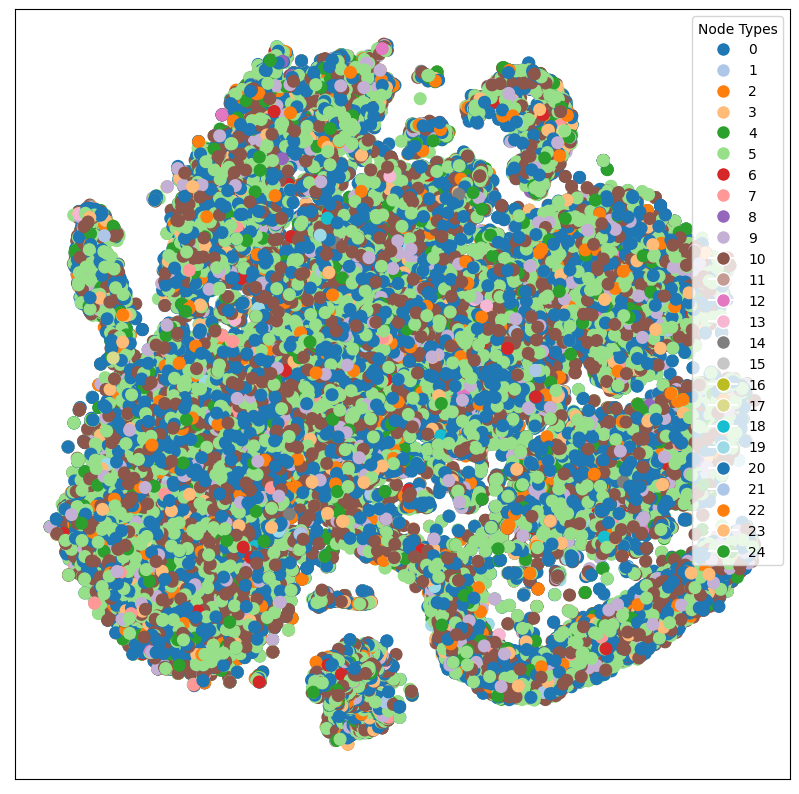

In [30]:
label_encoder = LabelEncoder()
nodes_type_encoded = label_encoder.fit_transform(nodes.type)

visualize(df, nodes_type_encoded)

In [7]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score

# Prepare the labels
true_labels = nodes['type']

In [32]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Prepare the features and labels
X = df.values
y = true_labels

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train a classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

In [33]:
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Calculate precision and recall
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")

Accuracy: 0.2622
Precision: 0.2071
Recall: 0.2622


In [34]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

selected_classes = ['miRNA', 'Gene', 'Disease']

filtered_embeddings = []
filtered_labels = []


for class_label in selected_classes:

    class_indices = nodes[nodes['type'] == class_label].index


    class_embeddings = df.iloc[class_indices, 1:].values  # Skip the first column with identifiers

    # Append the filtered embeddings and labels
    filtered_embeddings.append(class_embeddings)
    filtered_labels.extend([class_label] * len(class_embeddings))


X_filtered = np.vstack(filtered_embeddings)

# Encode the labels
le = LabelEncoder()
y_filtered = le.fit_transform(filtered_labels)  # Convert the labels into numerical form


X_train, X_test, y_train, y_test = train_test_split(X_filtered, y_filtered, test_size=0.3, random_state=42)

clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Calculate precision and recall
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")

precision_per_class = precision_score(y_test, y_pred, average=None, labels=np.unique(y_filtered))
recall_per_class = recall_score(y_test, y_pred, average=None, labels=np.unique(y_filtered))

for i, class_label in enumerate(le.classes_):
    if class_label in selected_classes:
        print(f"Class: {class_label}")
        print(f"  Precision: {precision_per_class[i]:.4f}")
        print(f"  Recall: {recall_per_class[i]:.4f}")


Accuracy: 0.4940
Precision: 0.4631
Recall: 0.4940
Class: Disease
  Precision: 0.5169
  Recall: 0.7700
Class: Gene
  Precision: 0.4201
  Recall: 0.2416
Class: miRNA
  Precision: 0.3333
  Recall: 0.0009


In [29]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Prepare the features and labels
X = df.values
y = true_labels

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Train a classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Accuracy: 0.26459499146723814
Classification Report:
                           precision    recall  f1-score   support

                  Anatomy       0.11      0.00      0.00      1809
                     Cell       0.00      0.00      0.00       378
                 Chemical       0.00      0.00      0.00       655
               Chromosome       0.00      0.00      0.00        95
                  Disease       0.28      0.62      0.39      7149
              Environment       0.00      0.00      0.00       128
   Environmental exposure       0.00      0.00      0.00       133
                     Food       0.00      0.00      0.00        58
                       GO       0.00      0.00      0.00      1271
                     Gene       0.24      0.20      0.22      5950
  General medical science       0.00      0.00      0.00         1
          Genomic feature       0.00      0.00      0.00        30
Human developmental stage       0.00      0.00      0.00        18
        

In [35]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Prepare the labels
true_labels = nodes['type']
X =  df.values

# Encode the labels
le = LabelEncoder()
y = le.fit_transform(true_labels)  # Convert the labels into numerical form

class_distribution = np.bincount(y)
print("Class distribution:", dict(zip(le.classes_, class_distribution)))

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train a classifier
clf = RandomForestClassifier(random_state=42,  class_weight='balanced')
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Calculate overall accuracy
accuracy = accuracy_score(y_test, y_pred)

# Calculate precision, recall, and f1-score for each class (node type)
precision = precision_score(y_test, y_pred, average=None)
recall = recall_score(y_test, y_pred, average=None)
f1 = f1_score(y_test, y_pred, average=None)

# Print the overall accuracy
print(f"Overall Accuracy: {accuracy:.4f}")

for i, class_label in enumerate(le.classes_):
    try:
        precision_class = precision_score(y_test, y_pred, labels=[i], average='macro')
        recall_class = recall_score(y_test, y_pred, labels=[i], average='macro')
        f1_class = f1_score(y_test, y_pred, labels=[i], average='macro')
        print(f"Class: {class_label}")
        print(f"  Precision: {precision[i]:.4f}")
        print(f"  Recall: {recall[i]:.4f}")
        print(f"  F1 Score: {f1[i]:.4f}")
    except IndexError:
        print(f"Class: {class_label}")
        print("  Precision: 0.0000 (No predictions for this class)")
        print("  Recall: 0.0000")
        print("  F1 Score: 0.0000")

Class distribution: {'Anatomy': 6084, 'Basic formal': 1, 'Cell': 1272, 'Chemical': 2239, 'Chromosome': 310, 'Disease': 24203, 'Environment': 453, 'Environmental exposure': 419, 'Food': 181, 'GO': 4050, 'Gene': 19517, 'General medical science': 6, 'Genomic feature': 98, 'Human developmental stage': 72, 'Medical action': 114, 'Mental disease': 12, 'Mental functioning': 14, 'Mouse pathology': 75, 'NCI thesaurus': 84, 'Neuro behaviour': 153, 'Phenotype': 19152, 'Protein': 205, 'Species': 1784, 'Vaccine': 1, 'miRNA': 3488}
Overall Accuracy: 0.2604
Class: Anatomy
  Precision: 0.0741
  Recall: 0.0022
  F1 Score: 0.0043
Class: Basic formal
  Precision: 0.0000
  Recall: 0.0000
  F1 Score: 0.0000
Class: Cell
  Precision: 0.0000
  Recall: 0.0000
  F1 Score: 0.0000
Class: Chemical
  Precision: 0.0000
  Recall: 0.0000
  F1 Score: 0.0000
Class: Chromosome
  Precision: 0.2807
  Recall: 0.6492
  F1 Score: 0.3919
Class: Disease
  Precision: 0.0000
  Recall: 0.0000
  F1 Score: 0.0000
Class: Environment


In [14]:
# basics
import numpy as np
import pandas as pd
import tensorflow as tf

# math
from math import ceil
from math import log
from math import log10

# utils
import itertools as it
import time
#from varname import nameof # get the name of a variable
import pickle
from tqdm.auto import tqdm, trange
#from tqdm import tqdm  RuntimeError: CUDA error: device-side assert triggered
import inspect
from grape.datasets.linqs import get_words_data # words information is excluded
from sklearn.preprocessing import LabelEncoder


# plot
import matplotlib as mpl
import matplotlib.pyplot as plt
import tikzplotlib
#from barplots import barplots
import matplotlib.colors as colors
import seaborn as sns
from sklearn.manifold import TSNE


# torch geometrics
import torch
import torch.optim as optim

from torch_geometric.datasets import FB15k_237
from torch_geometric.nn import ComplEx, DistMult, RotatE, TransE
from torch_geometric.data import Data

import os.path as osp

# Convolutional GNN
import torch_geometric.transforms as T

from torch_geometric.datasets import Planetoid
from torch_geometric.nn import GCNConv
from torch_geometric.utils import negative_sampling
from torch_geometric.loader import LinkNeighborLoader
from torch_geometric.transforms import RandomLinkSplit

from sklearn.metrics import roc_auc_score
# # Grape

In [17]:
# # Grape
# from grape.datasets import get_all_available_graphs_dataframe
# from grape.datasets import get_dataset
from grape import Graph
from grape import GraphVisualizer

# # Ensmallen
# from grape.embedders import Node2VecCBOWEnsmallen, Node2VecGloVeEnsmallen, Node2VecSkipGramEnsmallen
# from grape.embedders import DeepWalkCBOWEnsmallen, DeepWalkGloVeEnsmallen, DeepWalkSkipGramEnsmallen
# from grape.embedders import WalkletsSkipGramEnsmallen, WalkletsCBOWEnsmallen, WalkletsGloVeEnsmallen
# from grape.embedders import FirstOrderLINEEnsmallen, SecondOrderLINEEnsmallen
# #from grape.embedders import NetMFEnsmallen, GLEEEnsmallen, HOPEEnsmallen
from grape.embedders import TransEEnsmallen

# # TensorFlow
# from grape.embedders import SkipGramTensorFlow, CBOWTensorFlow
# from grape.embedders import FirstOrderLINETensorFlow, SecondOrderLINETensorFlow

# # KarateClub
# from grape.embedders import Role2VecKarateClub, GraRepKarateClub
# from grape.embedders import NMFADMMKarateClub, RandNEKarateClub


# # Edge prediction evaluation
from grape.edge_prediction import edge_prediction_evaluation
from grape.edge_prediction import DecisionTreeEdgePrediction, RandomForestEdgePrediction, ExtraTreesEdgePrediction, MLPEdgePrediction, GradientBoostingEdgePrediction,PerceptronEdgePrediction

# from grape.edge_prediction import KipfGCNEdgePrediction

# # Node Label prediction evaluation
# from grape.node_label_prediction import node_label_prediction_evaluation
# from grape.node_label_prediction import DecisionTreeNodeLabelPrediction, RandomForestNodeLabelPrediction, MLPNodeLabelPrediction, GradientBoostingNodeLabelPrediction#, PerceptronNodeLabelPrediction

In [ ]:
# IMPORT METHODS

# One-hot encoding of the types
class TypeOneHotEncoder:
    def __init__(self, sep='|'):
        self.sep = sep

    def __call__(self, df):
        types = set(g for col in df.values for g in col.split(self.sep))
        mapping = {type: i for i, type in enumerate(types)}

        x = torch.zeros(len(df), len(mapping))
        for i, col in enumerate(df.values):
            for type in col.split(self.sep):
                x[i, mapping[type]] = 1
        return x

# Integer encoding for types
class TypeIntegerEncoder:
    def __init__(self, sep='|'):
        self.sep = sep

    def __call__(self, df):
        types = set(g for col in df.values for g in col.split(self.sep))
        mapping = {type: i for i, type in enumerate(types)}

        x = torch.zeros(len(df), 1)
        for i, type in enumerate(df.values):
                x[i] = mapping[type]
        return x.to(torch.float)

In [ ]:
def load_node_df(df, index_col, encoders=None, **kwargs):

    # Integer encoding for the types
    type_mapping: Dict[str, int] = {}

    df = df.set_index(index_col)
    # Create te mapping for the index
    mapping = {index: i for i, index in enumerate(df.index.unique())}

    # Create the features for the nodes
    x = None
    if encoders is not None:
        xs = [encoder(df[col]) for col, encoder in encoders.items()]
        x = torch.cat(xs, dim=-1)

    return x, mapping

def load_edge_df(df, src_index_col, src_mapping, dst_index_col, dst_mapping,
                 pred_index_col=None, pred_mapping=None, encoders=None, **kwargs):

    src = [src_mapping[index] for index in df[src_index_col]]
    dst = [dst_mapping[index] for index in df[dst_index_col]]
    edge_index = torch.tensor([src, dst])

    # Edge Types
    edge_attr = None
    # Edge mapping
    if pred_mapping is not None:
        edge_attrs = torch.zeros(len(df), 1)
        for i, type in enumerate(df[pred_index_col].values):
            edge_attrs[i] = pred_mapping[type]
        edge_attr = edge_attrs.to(torch.int64)
    # No mapping but encoder
    if encoders is not None:
        edge_attrs = [encoder(df[col]) for col, encoder in encoders.items()]
        edge_attr = torch.cat(edge_attrs, dim=-1)

    return edge_index, edge_attr

In [9]:
from grape import Graph # type: ignore
rna_kg_graph = Graph.from_pd(
    edges_df=edges_df,
    nodes_df=nodes,
    node_name_column="name",
    node_type_column="type",
    edge_src_column="subject",
    edge_dst_column="object",
    #edge_weight_column="weight",
    edge_type_column="type",
    node_types_separator="|",
    directed=False,
    name=view_name,
)

rna_kg_graph_directed = Graph.from_pd(
    edges_df=edges_df,
    nodes_df=nodes,
    node_name_column="name",
    node_type_column="type",
    edge_src_column="subject",
    edge_dst_column="object",
    #edge_weight_column="weight",
    edge_type_column="type",
    node_types_separator="|",
    directed=True,
    name=view_name+"_directed",
)

2024-10-27 15:29:27.587519: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-10-27 15:29:27.637355: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-27 15:29:28.230244: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [10]:
graph = rna_kg_graph_directed
# Function to simplify node names
def simplify_node_names(graph):
    simplified_node_names = [name[0] for name in graph.get_node_names()]
    return simplified_node_names

# Apply to the graph
simplified_node_names = simplify_node_names(graph)

In [39]:
evaluation = edge_prediction_evaluation(
    holdouts_kwargs=dict(train_size=0.8),
    graphs=graph,
    models=[RandomForestEdgePrediction()],
    number_of_holdouts=5,
    node_features=df.values,  # Use simplified embedding features
    smoke_test=False,
    enable_cache=False
)

In [41]:
results = pd.concat([results, evaluation], ignore_index = True)
filename = "results_"+view_name+"_FirstOrderLINE_rdf2vec.csv"
results.to_csv(filename)

In [42]:
results

,evaluation_mode,train_size,validation_unbalance_rate,use_scale_free_distribution,informedness,positive_likelyhood_ratio,negative_likelyhood_ratio,miss_rate,accuracy,matthews_correlation_coefficient,...,"(model_parameters, max_features)","(model_parameters, max_leaf_nodes)","(model_parameters, min_impurity_decrease)","(model_parameters, bootstrap)","(model_parameters, oob_score)","(model_parameters, n_jobs)","(model_parameters, verbose)","(model_parameters, warm_start)","(model_parameters, ccp_alpha)","(model_parameters, max_samples)"
0,train,0.800001,1.0,True,0.001775,1.036529,0.998134,0.949624,0.500888,0.004093,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
1,test,0.800001,1.0,True,0.002849,1.058726,0.997005,0.948629,0.501425,0.006540,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
2,train,0.800001,1.0,True,0.000141,1.002940,0.999852,0.951861,0.500071,0.000330,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
3,test,0.800001,1.0,True,-0.000238,0.995113,1.000250,0.951601,0.499881,-0.000553,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
4,train,0.800001,1.0,True,-0.000634,0.988158,1.000670,0.947063,0.499683,-0.001413,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
5,test,0.800001,1.0,True,0.000086,1.001599,0.999909,0.946009,0.500043,0.000191,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
6,train,0.800001,1.0,True,0.000955,1.013359,0.998972,0.927596,0.500477,0.001847,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
7,test,0.800001,1.0,True,0.001411,1.019930,0.998481,0.927771,0.500706,0.002738,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
8,train,0.800001,1.0,True,-0.000680,0.982342,1.000707,0.962187,0.499660,-0.001774,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
9,test,0.800001,1.0,True,0.000068,1.001791,0.999929,0.961765,0.500034,0.000178,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None


In [35]:
evaluation = edge_prediction_evaluation(
    holdouts_kwargs=dict(train_size=0.8),
    graphs=graph,
    models=[DecisionTreeEdgePrediction()],
    number_of_holdouts=5,
    node_features=df.values,  # Use simplified embedding features
    smoke_test=False
)


Evaluating on VIEW0_directed:   0%|          | 0/5 [00:00<?, ?it/s]

In [36]:
results = evaluation
filename = "results_"+view_name+"_FirstOrderLINE_DesicionTree_rdf2vec.csv"
results.to_csv(filename)

In [37]:
results

,evaluation_mode,train_size,validation_unbalance_rate,use_scale_free_distribution,informedness,f1_score,balanced_accuracy,threat_score,false_discovery_rate,positive_likelyhood_ratio,...,"(model_parameters, criterion)","(model_parameters, splitter)","(model_parameters, max_depth)","(model_parameters, min_samples_split)","(model_parameters, min_samples_leaf)","(model_parameters, min_weight_fraction_leaf)","(model_parameters, max_features)","(model_parameters, max_leaf_nodes)","(model_parameters, min_impurity_decrease)","(model_parameters, ccp_alpha)"
0,train,0.800001,1.0,True,-0.001590,0.356449,0.499205,0.216877,0.501429,0.994299,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
1,test,0.800001,1.0,True,-0.002297,0.355445,0.498852,0.216135,0.502069,0.991758,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
0,train,0.800001,1.0,True,0.005336,0.366196,0.502668,0.224137,0.495314,1.018920,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
1,test,0.800001,1.0,True,0.006335,0.367791,0.503167,0.225333,0.494460,1.022408,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
0,train,0.800001,1.0,True,-0.002462,0.302849,0.498769,0.178445,0.502811,0.988821,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
1,test,0.800001,1.0,True,-0.003141,0.301289,0.498430,0.177363,0.503604,0.985687,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
0,train,0.800001,1.0,True,-0.001616,0.224813,0.499192,0.126642,0.502766,0.988998,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
1,test,0.800001,1.0,True,-0.000942,0.225055,0.499529,0.126795,0.501615,0.993561,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
0,train,0.800001,1.0,True,0.001535,0.228586,0.500767,0.129041,0.497393,1.010483,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
1,test,0.800001,1.0,True,0.000859,0.228784,0.500429,0.129168,0.498547,1.005828,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0


In [38]:
# Separate train and test results
train_results = evaluation[evaluation['evaluation_mode'] == 'train']
test_results = evaluation[evaluation['evaluation_mode'] == 'test']

# Function to compute mean metrics for a given evaluation mode
def compute_mean_metrics(data, mode):
    results = []
    for holdout in data['holdout_number'].unique():
        holdout_data = data[data['holdout_number'] == holdout]

        # Calculate mean values for metrics
        auc_score = holdout_data['auroc'].mean()
        precision = holdout_data['precision'].mean()
        recall = holdout_data['recall'].mean()
        f1_score = holdout_data['f1_score'].mean()
        accuracy = holdout_data['accuracy'].mean()  # Assuming 'accuracy' column exists

        # Append results for this holdout
        results.append({
            'Holdout': holdout,
            'AUC': auc_score,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1_score,
            'Accuracy': accuracy
        })

    # Convert to DataFrame
    return pd.DataFrame(results)

# Compute metrics for train and test
train_metrics_df = compute_mean_metrics(train_results, 'Train')
test_metrics_df = compute_mean_metrics(test_results, 'Test')    

# Calculate overall mean for train and test
overall_train_mean = train_metrics_df.mean(numeric_only=True)
overall_test_mean = test_metrics_df.mean(numeric_only=True)

# Create a summary DataFrame
summary_df = pd.DataFrame({
    'Evaluation Mode': ['Train', 'Test'],
    'AUC': [overall_train_mean['AUC'], overall_test_mean['AUC']],
    'Precision': [overall_train_mean['Precision'], overall_test_mean['Precision']],
    'Recall': [overall_train_mean['Recall'], overall_test_mean['Recall']],
    'F1 Score': [overall_train_mean['F1 Score'], overall_test_mean['F1 Score']],
    'Accuracy': [overall_train_mean['Accuracy'], overall_test_mean['Accuracy']]
})

# Display the summary of mean metrics
print(summary_df)


  Evaluation Mode       AUC  Precision    Recall  F1 Score  Accuracy
0           Train  0.502054   0.500057  0.215127  0.295778  0.500120
1            Test  0.507636   0.499941  0.215044  0.295673  0.500081


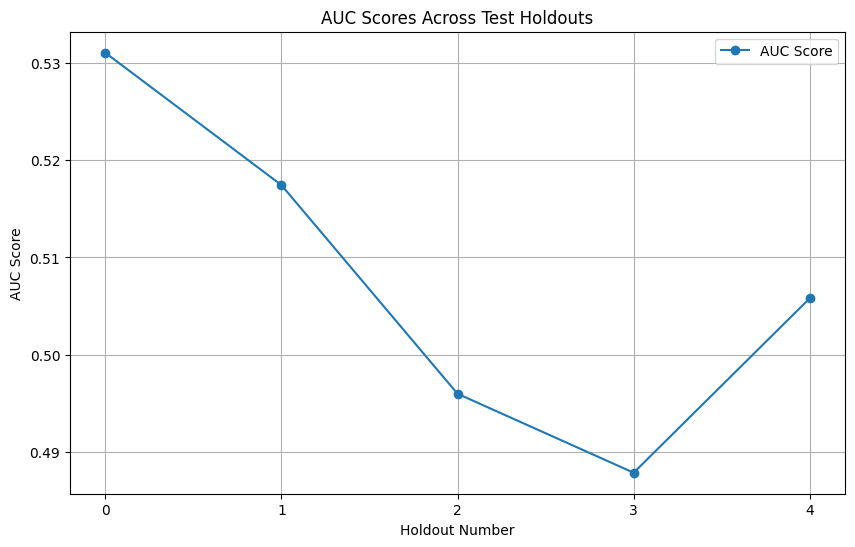

In [43]:
# Plotting AUC Scores for test mode
plt.figure(figsize=(10, 6))
plt.plot(results_df['Holdout'], results_df['AUC'], marker='o', label='AUC Score')
plt.title('AUC Scores Across Test Holdouts')
plt.xlabel('Holdout Number')
plt.ylabel('AUC Score')
plt.xticks(results_df['Holdout'])
plt.grid()
plt.legend()
plt.show()
